Вводные: Построить модель предсказания временных рядов с максимально лучшим результатом. <br>
Может использовать любую библиотеку на python, а может взять ETNA - библиотеку от Тинькофф <br>
В качестве результата, жду jupyter notebook  или google colab

## Предобработка
Импорт библиотек для работы

In [1036]:
from etna.datasets import generate_periodic_df
from etna.datasets import TSDataset
from etna.analysis import seasonal_plot

import pandas as pd
from datetime import date
import holidays

from etna.transforms import DateFlagsTransform
from etna.transforms import LagTransform

Обработка данных для приведения в формат ETNA

In [1037]:
df = pd.read_excel('C:/Users/Никита Алексеевич/11111111111111/test.xlsx') # чтение файла
df.rename(columns={'Система поиска': 'sys_serch', 'Система ГЕО': 'sys_geo', \
                   'Система девайс': 'sys_device', 'Дата визита': 'timestamp', \
                   'Параметр 1': 'param1', 'Параметр 2': 'param2'}, inplace=True) # переименование колонок


Смотрим информацию по данным, пропущенным значениям и типам столбцов

In [1038]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5840 entries, 0 to 5839
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   sys_serch   5840 non-null   int64 
 1   sys_geo     5840 non-null   int64 
 2   sys_device  5840 non-null   int64 
 3   timestamp   5840 non-null   object
 4   param1      5840 non-null   int64 
 5   param2      5840 non-null   int64 
dtypes: int64(5), object(1)
memory usage: 273.9+ KB


In [1039]:
# изменения типа столбца для создания сегмента
df.sys_serch = df.sys_serch.astype(str) 
df.sys_geo = df.sys_geo.astype(str)
df.sys_device = df.sys_device.astype(str)

df['segment'] = df.sys_serch + df.sys_geo + df.sys_device # создание сегментов
df = df.sort_values('timestamp').reset_index().drop('index', axis=1) # сортировка по дате по возрастанию

# Делим отдельно сегменты с параметром 1, и сегменты с параметром 2

df_1 = df[['timestamp', 'param1', 'segment']] # берем необходимые колонки для прогноза
df_2 = df[['timestamp', 'param2', 'segment']] # берем необходимые колонки для прогноза

# Переименовываем столбец для ETNA
df_1 = df_1.rename(columns={'param1': 'target'})
df_2 = df_2.rename(columns={'param2': 'target'})

df_1.timestamp = pd.to_datetime(df_1.timestamp) # переводим в формат datetime
df_2.timestamp = pd.to_datetime(df_2.timestamp) # переводим в формат datetime

Смотрим на получившиеся сегменты

In [1040]:
df_1.head()

,timestamp,target,segment
0,2022-01-01,411,221
1,2022-01-01,1382,121
2,2022-01-01,1810,111
3,2022-01-01,795,222
4,2022-01-01,1022,211


In [1041]:
df_2.head()

,timestamp,target,segment
0,2022-01-01,353,221
1,2022-01-01,1226,121
2,2022-01-01,1522,111
3,2022-01-01,679,222
4,2022-01-01,871,211


## Предварительный анализ

Переводим датафрейм в формат ETNA 

In [1042]:
df_a = TSDataset.to_dataset(df_1)
ts = TSDataset(df_a, freq="D")

In [1043]:
df_b = TSDataset.to_dataset(df_2)
ts_2 = TSDataset(df_b, freq="D")

In [1044]:
ts.describe()

,start_timestamp,end_timestamp,length,num_missing,num_segments,num_exogs,num_regressors,num_known_future,freq
segments,,,,,,,,,
111,2022-01-01,2023-12-31,730,0,8,0,0,0,D
112,2022-01-01,2023-12-31,730,0,8,0,0,0,D
121,2022-01-01,2023-12-31,730,0,8,0,0,0,D
122,2022-01-01,2023-12-31,730,0,8,0,0,0,D
211,2022-01-01,2023-12-31,730,0,8,0,0,0,D
212,2022-01-01,2023-12-31,730,0,8,0,0,0,D
221,2022-01-01,2023-12-31,730,0,8,0,0,0,D
222,2022-01-01,2023-12-31,730,0,8,0,0,0,D


Смотрим на получившийся датафрейм после преобразования в формат etna. <br>
Начальная дата первое число 2022 года, конечная 31 декабря 2023.  <br>
Пропущенных значений нет. <br>
Дополнительных регрессоров на данный момент нет. <br>
Частота данных день <br>

Простроим графики чтобы посмотреть на данные 

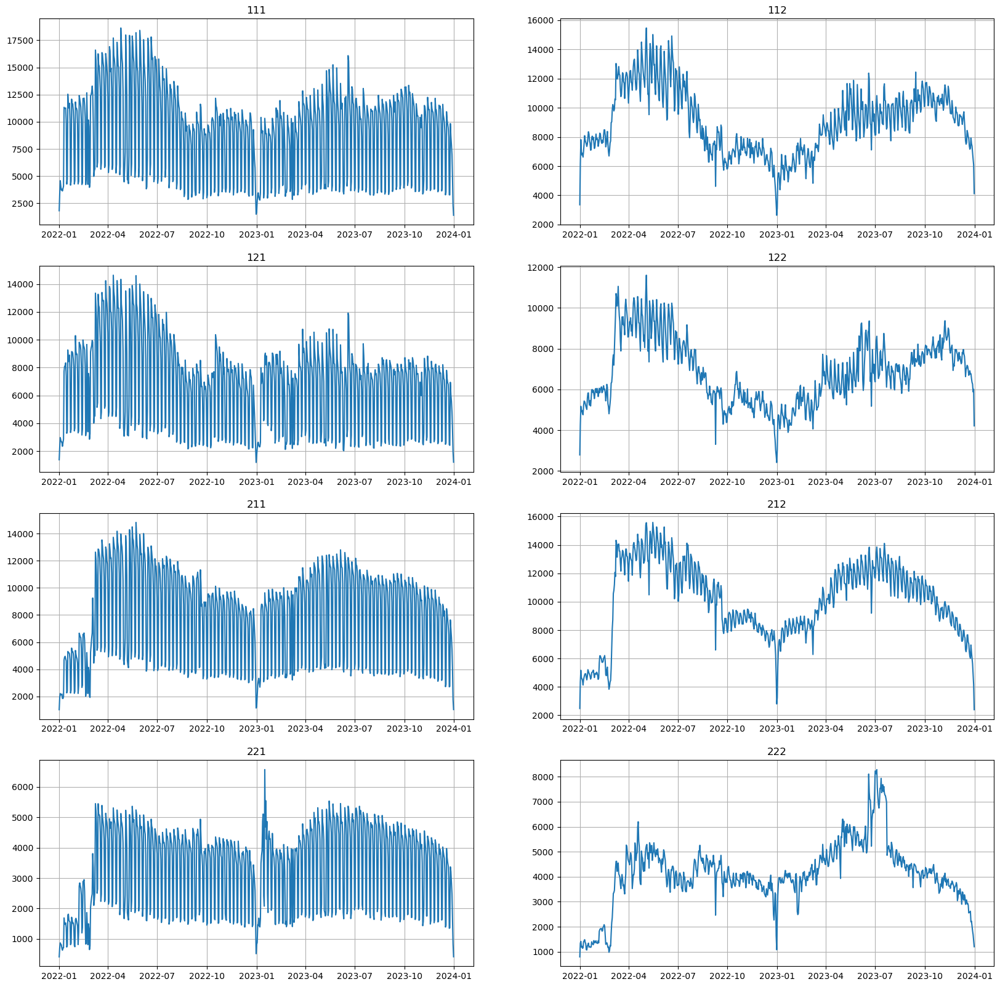

In [1045]:
ts.plot()

На первый взгляд в данных (даже плохо читаемых) виден тренд снижение к новому году.<br>
Подъем в весенне-летний период, так же подъем в некоторых сегментах в осенний период.<br>
Попробуем посмотреть это на других графиках<br>

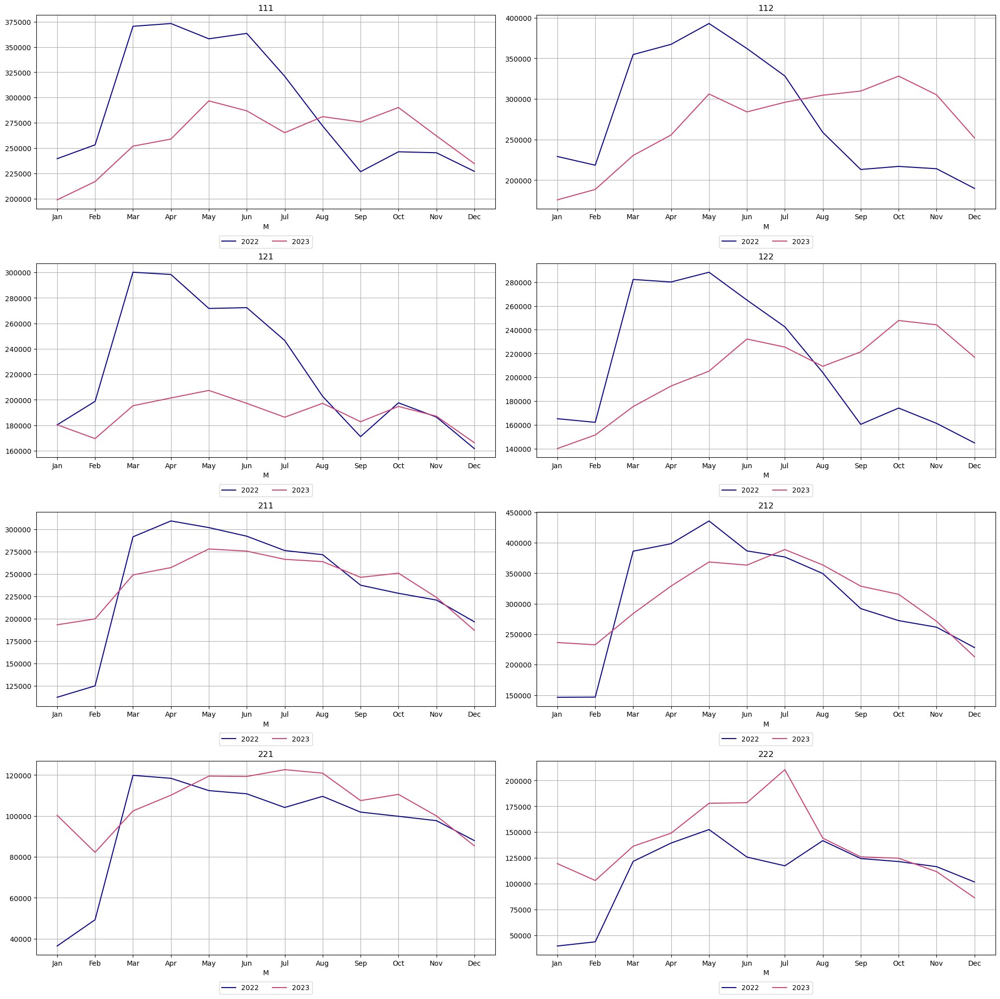

In [1046]:
seasonal_plot(ts, freq='M')

На данных графиках разная сезонность и мы видим какой сегмент просел по сравнению с предыдущим годом.
Это мы постораемся учесть в модели прогнозирования.
Так же на всех графиках есть снижение к новому году.

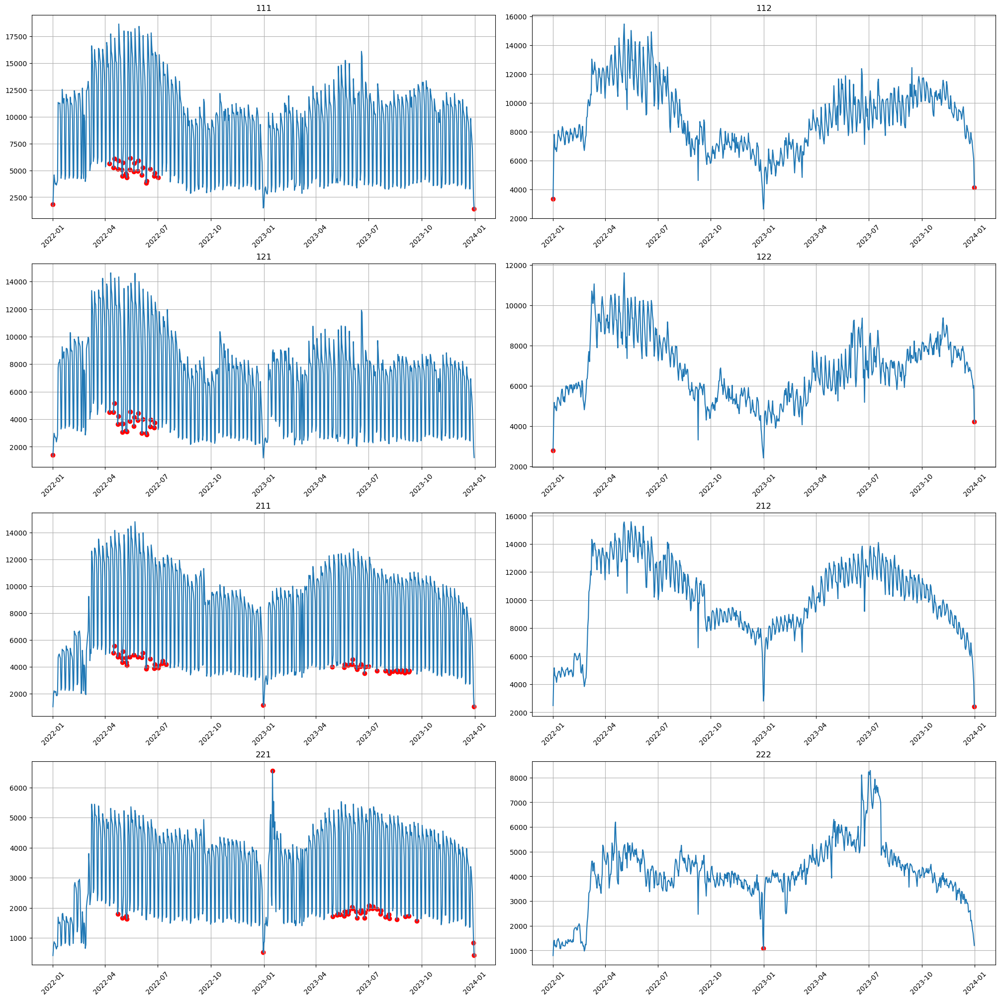

In [1047]:
from etna.analysis import get_anomalies_density, plot_anomalies

anomalies = get_anomalies_density(
    ts=ts, 
    window_size=45, 
    n_neighbors=25, 
    distance_coef=1.9
)
plot_anomalies(ts=ts, anomaly_dict=anomalies)

## Создание и отладка модели

По EDA мы видим некоторые признаки которые необходимо учесть

Обучать и позднее прогнозировать мы попробуем с моделью Prophet от Facebook<br>
прогнозирования временных рядов с сезонностью и трендом, а также для учёта праздников и других важных событий<br>
Прогнозировать будем на 90 дней с добавлением фичей в виде: праздников в РФ, выходных дней, дней недели, средних значений.<br>
Годовая сезонность будет отключена т.к. точно одинакового ежегодного тренда данные не дают, и с ней показатели точности хуже.<br>
Так же добавлены лаги праздничных дней. <br>
Выводные метрики SMAPE, MAE, MSE, MAPE

In [1048]:
from etna.transforms import HolidayTransform
from etna.transforms import MeanTransform
from etna.transforms import LagTransform
from etna.pipeline import Pipeline
from etna.models import ProphetModel
from etna.metrics import MAE, MSE, MAPE, SMAPE

HORIZON = 90
lag_week = LagTransform(in_column="target", lags=list(range(HORIZON, HORIZON+7)), out_column="regressor_lag")
mean_tr = MeanTransform(in_column="regressor_lag_90", out_column="regressor_mean", window=10, seasonality=14)
date_tr = DateFlagsTransform(out_column="d_flags",
                             day_number_in_week=True,
                             day_number_in_month=True,
                             is_weekend=True,
                             special_days_in_week=[4])

holiday_RU = HolidayTransform(iso_code="RU", out_column="regressor_RU_holidays")

holiday_lag_ru = LagTransform(in_column="regressor_RU_holidays", lags=list(range(2,6)), 
                               out_column="regressor_RU_holidays_lag")

model = ProphetModel(
                    daily_seasonality=False, 
                    weekly_seasonality=True, 
                    yearly_seasonality=False,
                    holidays_prior_scale=1,
                    growth="flat")

pipe = Pipeline(model=model, transforms=[lag_week, mean_tr, date_tr, holiday_RU, holiday_lag_ru], horizon=90)
smape = SMAPE()
mae = MAE()
mse = MSE()
mape = MAPE()

metrics, forecast, info = pipe.backtest(ts=ts, metrics=[smape, mae, mse, mape], n_folds=3)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
00:06:35 - cmdstanpy - INFO - Chain [1] start processing
00:06:35 - cmdstanpy - INFO - Chain [1] done processing
00:06:35 - cmdstanpy - INFO - Chain [1] start processing
00:06:35 - cmdstanpy - INFO - Chain [1] done processing
00:06:35 - cmdstanpy - INFO - Chain [1] start processing
00:06:35 - cmdstanpy - INFO - Chain [1] done processing
00:06:35 - cmdstanpy - INFO - Chain [1] start processing
00:06:35 - cmdstanpy - INFO - Chain [1] done processing
00:06:35 - cmdstanpy - INFO - Chain [1] start processing
00:06:35 - cmdstanpy - INFO - Chain [1] done processing
00:06:35 - cmdstanpy - INFO - Chain [1] start processing
00:06:35 - cmdstanpy - INFO - Chain [1] done processing
00:06:35 - cmdstanpy - INFO - Chain [1] start processing
00:06:35 - cmdstanpy - INFO - Chain [1] done processing
00:06:35 - cmdstanpy - INFO - Chain [1] start processing
00:06:35 - cmdstanpy - INFO - Chain [1] done processing
[Parallel(n_job

Показания метрик по точности прогноза

In [1049]:
ob = metrics.groupby('segment', as_index=False).agg({'SMAPE': 'mean', 'MAE': 'mean', 'MSE': 'mean', 'MAPE': 'mean'})
ob = ob.round(2)
ob

,segment,SMAPE,MAE,MSE,MAPE
0,111,14.25,1057.29,2089965.26,16.90
1,112,12.69,1210.25,2010115.17,13.18
2,121,19.55,1149.45,2016768.21,23.68
3,122,14.72,1062.05,1520848.17,14.94
4,211,9.60,675.29,1036954.45,10.71
5,212,8.30,807.97,1097592.10,9.13
6,221,12.91,443.76,350674.63,13.43
7,222,24.29,1127.47,2217565.68,23.84


Если смотрет на результаты то отклонение в процентах SMAPE от 8 до 24, что не совсем приемлемо<br>
Метрика MAPE по 222 сегменту до 24% ошибка, что требует корректировки.<br>
Нужно дополнительно тюнить модельку.

In [1050]:
ob.median() # медианны показателей сегментов

segment        166.500
SMAPE           13.580
MAE           1059.670
MSE        1765481.670
MAPE            14.185
dtype: float64

Посмотрим на визуализаю прогнозных значений

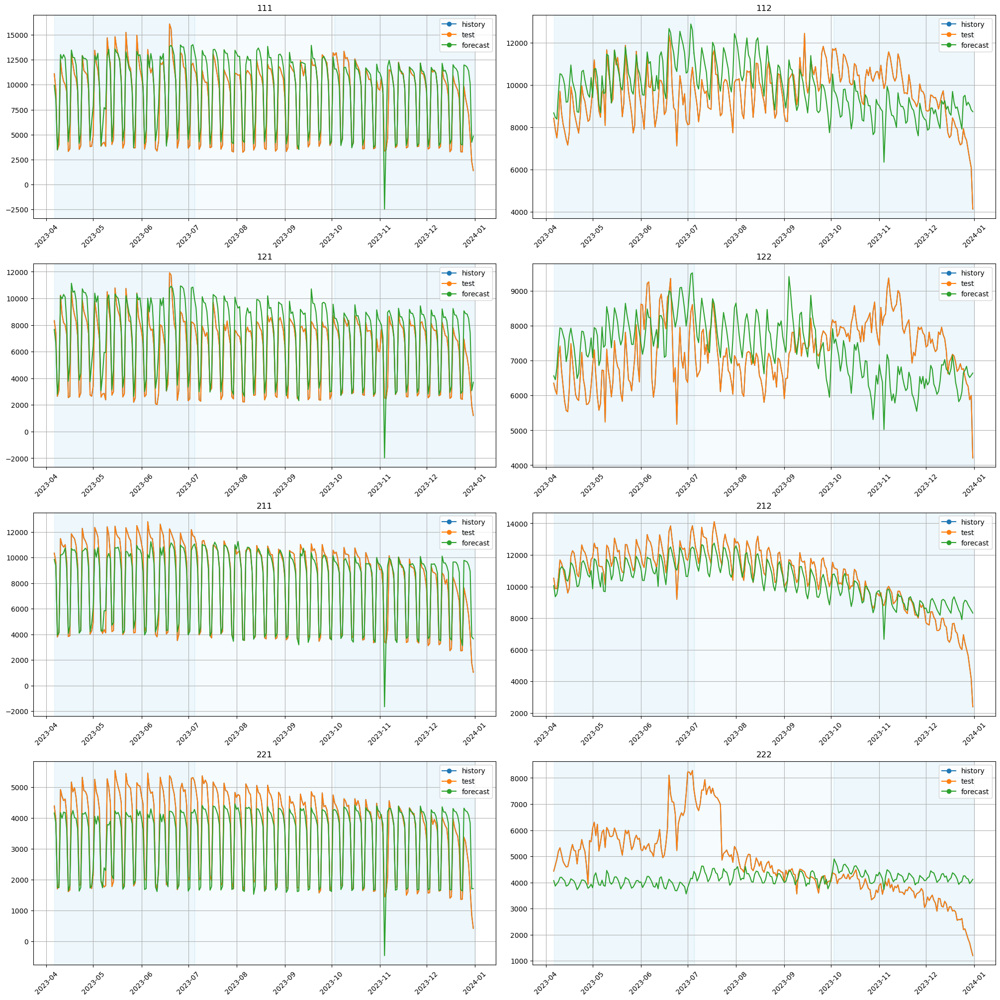

In [1051]:
from etna.analysis import plot_backtest

plot_backtest(forecast_df=forecast, ts=ts)

Для более детального анализа возьмем интерактивный график<br>
Самый сильный перекос в прогнозе в сегменте 222, очень сильное поднятие летних значений, но прогнозное не повысилось. <br>
Так же сильный спад с начала декабря до нового года, тоже не учелся моделью. <br>
Пробовал прописать отдельные точки(changepoints) в эти дни не помогло.<br>
В основном у всех сегментов явная тендеция снижения к новому году.

In [1052]:
from etna.analysis import plot_backtest_interactive

plot_backtest_interactive(forecast_df=forecast, ts=ts, figsize = (1000, 800))

Далее посмотрим на второй сегмент ts_2(df_2)

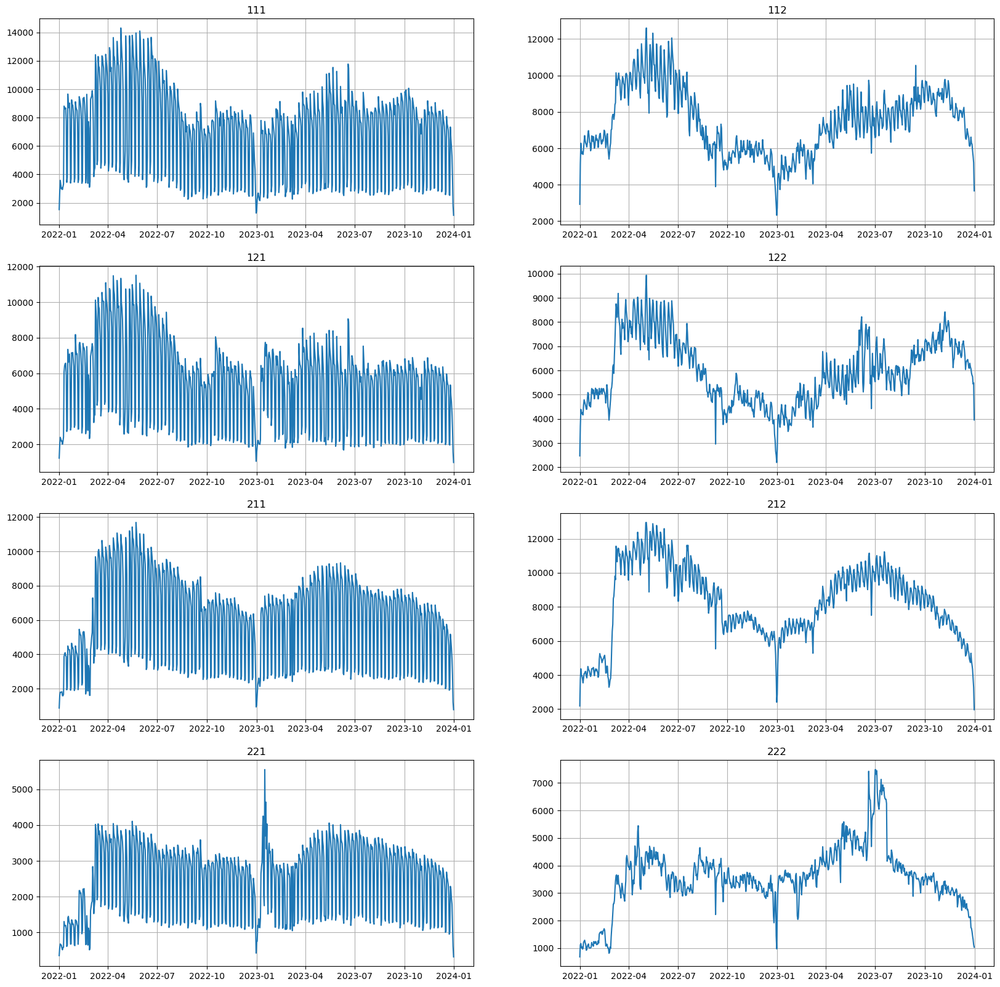

In [1053]:
ts_2.plot()

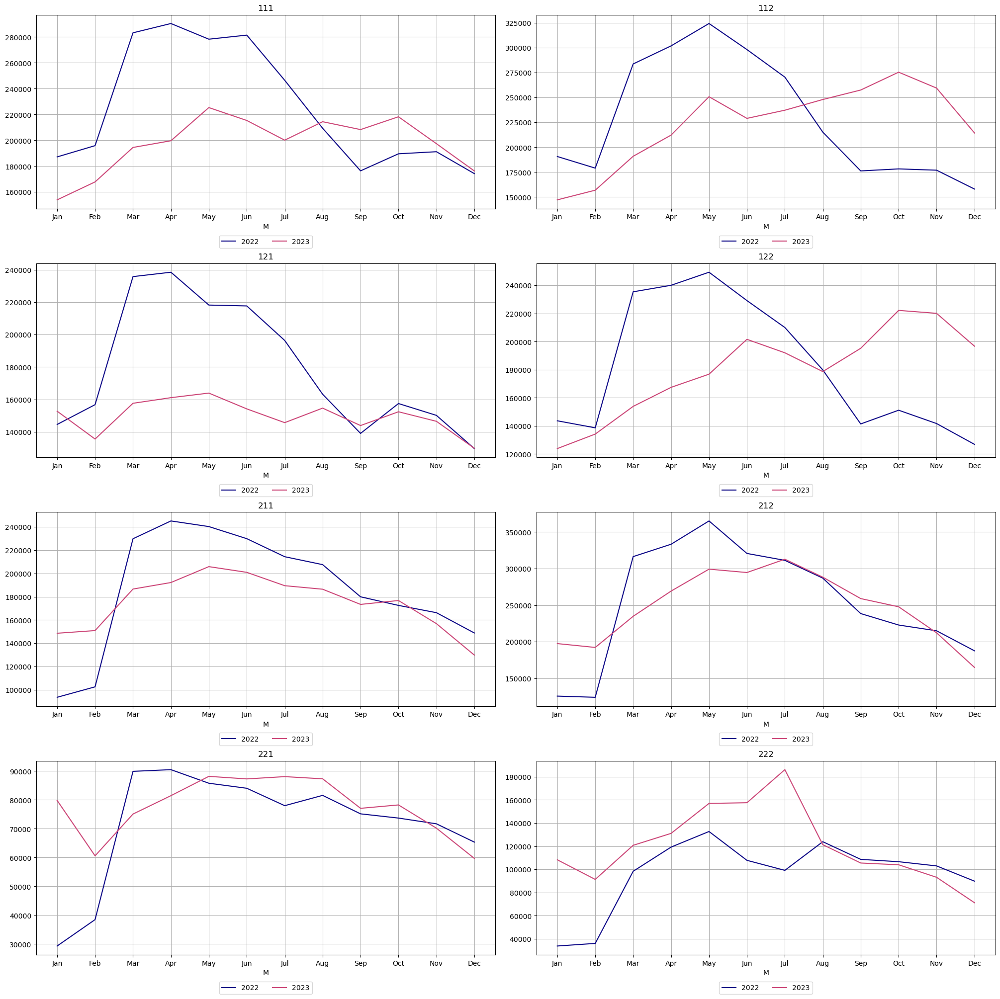

In [1054]:
seasonal_plot(ts_2, freq='M')

Посмотрим на аномалии в данных

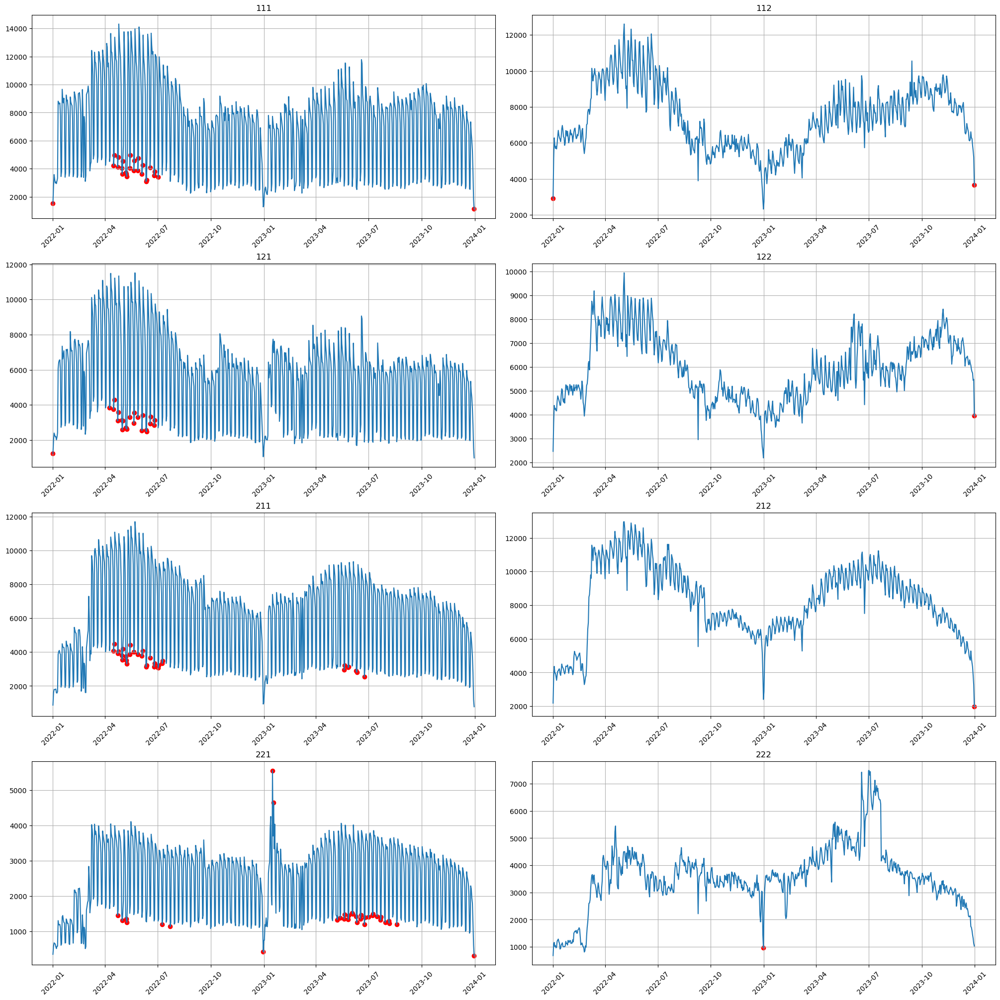

In [1055]:
from etna.analysis import get_anomalies_density, plot_anomalies

anomalies = get_anomalies_density(
    ts=ts_2, 
    window_size=45, 
    n_neighbors=25, 
    distance_coef=1.9
)
plot_anomalies(ts=ts_2, anomaly_dict=anomalies)

Данные очень похожи посмотрим на корреляцию этих параметров

In [1056]:
df_1.corrwith(df_2)

target    0.991849
dtype: float64

Данные коррелируют что можно было бы использовать для прогноза, но prophet использует экзогенные данные. <br>
В целом можно попробовать прогнозировать одну модель по другой, но более вероятен риск ошибки.

Посмотрим как сработает модель на втором TSDframe - ts_2

In [1057]:
metrics, forecast, info = pipe.backtest(ts=ts_2, metrics=[smape, mae, mse, mape], n_folds=3)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
00:06:47 - cmdstanpy - INFO - Chain [1] start processing
00:06:47 - cmdstanpy - INFO - Chain [1] done processing
00:06:47 - cmdstanpy - INFO - Chain [1] start processing
00:06:47 - cmdstanpy - INFO - Chain [1] done processing
00:06:47 - cmdstanpy - INFO - Chain [1] start processing
00:06:47 - cmdstanpy - INFO - Chain [1] done processing
00:06:47 - cmdstanpy - INFO - Chain [1] start processing
00:06:47 - cmdstanpy - INFO - Chain [1] done processing
00:06:47 - cmdstanpy - INFO - Chain [1] start processing
00:06:47 - cmdstanpy - INFO - Chain [1] done processing
00:06:47 - cmdstanpy - INFO - Chain [1] start processing
00:06:47 - cmdstanpy - INFO - Chain [1] done processing
00:06:47 - cmdstanpy - INFO - Chain [1] start processing
00:06:47 - cmdstanpy - INFO - Chain [1] done processing
00:06:48 - cmdstanpy - INFO - Chain [1] start processing
00:06:48 - cmdstanpy - INFO - Chain [1] done processing
[Parallel(n_job

In [1064]:
ob_2 = metrics.groupby('segment', as_index=False).agg({'SMAPE': 'mean', 'MAE': 'mean', 'MSE': 'mean', 'MAPE': 'mean'}).round(2)
ob_2

,segment,SMAPE,MAE,MSE,MAPE
0,111,15.29,882.02,1347386.17,18.09
1,112,14.14,1122.32,1671148.31,14.58
2,121,21.40,1010.86,1456020.79,25.86
3,122,16.53,1044.62,1454829.18,16.61
4,211,12.90,631.86,789924.21,15.21
5,212,7.55,559.34,723399.46,8.85
6,221,12.59,306.95,169624.37,13.47
7,222,27.02,1084.69,1976506.23,27.78


In [1059]:
ob_2.median()

segment        166.500
SMAPE           14.715
MAE            946.440
MSE        1401107.675
MAPE            15.910
dtype: float64

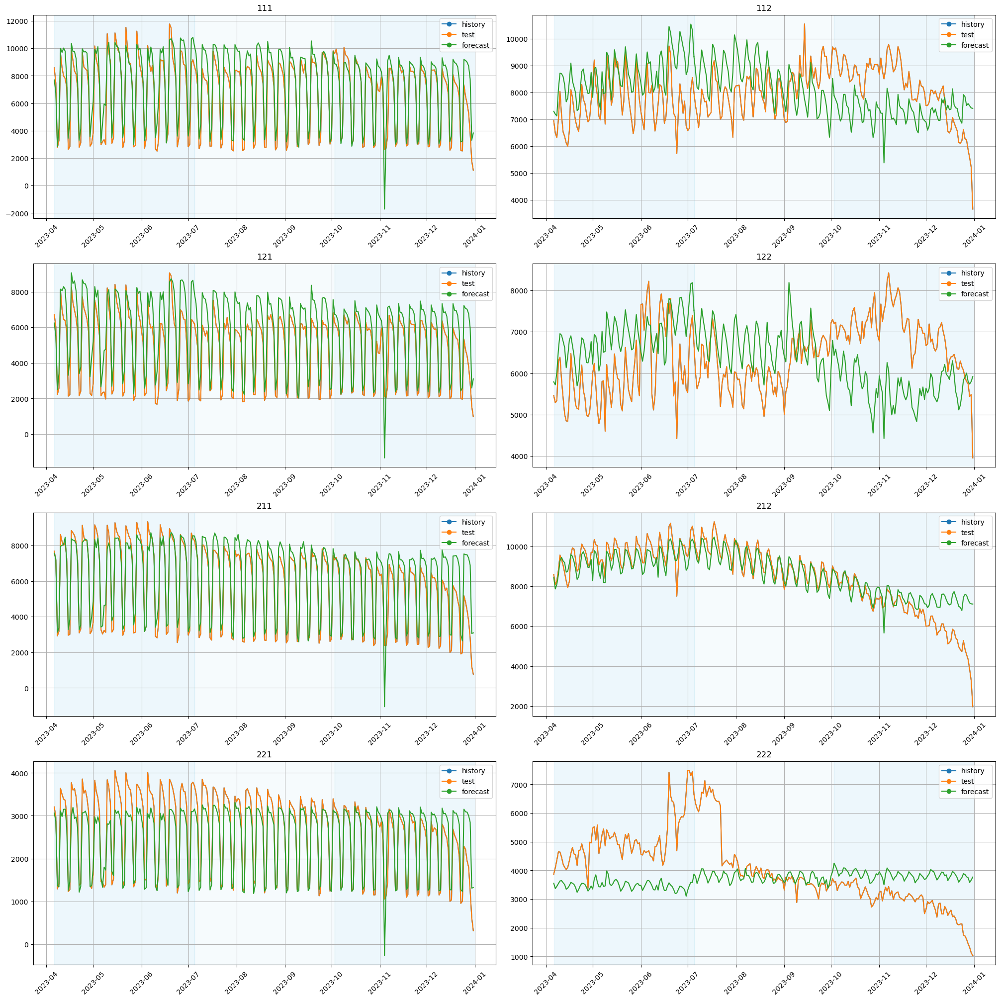

In [1063]:
plot_backtest(forecast_df=forecast, ts=ts_2)

## Прогноз сегментов

00:06:54 - cmdstanpy - INFO - Chain [1] start processing
00:06:54 - cmdstanpy - INFO - Chain [1] done processing
00:06:54 - cmdstanpy - INFO - Chain [1] start processing
00:06:54 - cmdstanpy - INFO - Chain [1] done processing
00:06:54 - cmdstanpy - INFO - Chain [1] start processing
00:06:54 - cmdstanpy - INFO - Chain [1] done processing
00:06:54 - cmdstanpy - INFO - Chain [1] start processing
00:06:54 - cmdstanpy - INFO - Chain [1] done processing
00:06:54 - cmdstanpy - INFO - Chain [1] start processing
00:06:54 - cmdstanpy - INFO - Chain [1] done processing
00:06:54 - cmdstanpy - INFO - Chain [1] start processing
00:06:54 - cmdstanpy - INFO - Chain [1] done processing
00:06:55 - cmdstanpy - INFO - Chain [1] start processing
00:06:55 - cmdstanpy - INFO - Chain [1] done processing
00:06:55 - cmdstanpy - INFO - Chain [1] start processing
00:06:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\Никита Алексеевич\AppData\Roaming\Python\Python39\site-packages\etna\datasets\tsdataset

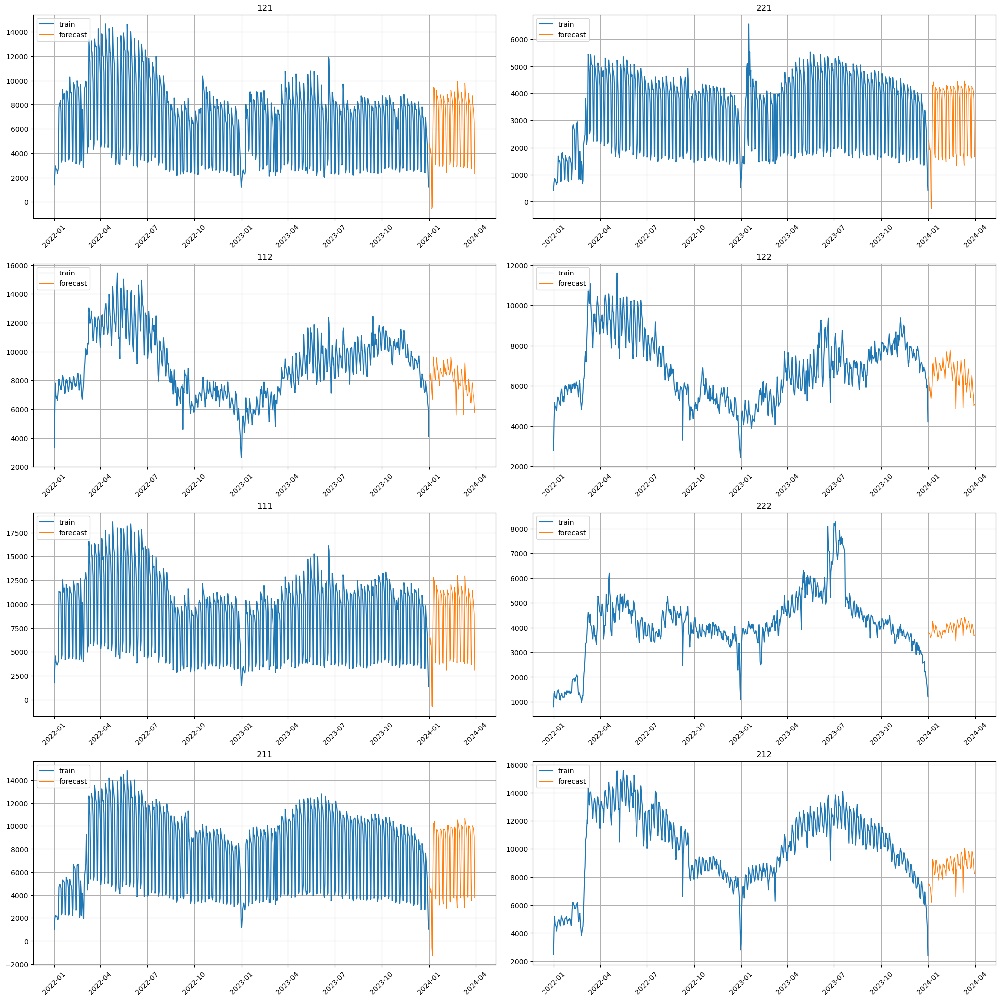

In [1060]:
from etna.analysis import plot_forecast

pipe.fit(ts)
forecast_1 = pipe.forecast()

plot_forecast(forecast_ts=forecast_1, train_ts=ts)

00:12:21 - cmdstanpy - INFO - Chain [1] start processing
00:12:21 - cmdstanpy - INFO - Chain [1] done processing
00:12:21 - cmdstanpy - INFO - Chain [1] start processing
00:12:21 - cmdstanpy - INFO - Chain [1] done processing
00:12:21 - cmdstanpy - INFO - Chain [1] start processing
00:12:21 - cmdstanpy - INFO - Chain [1] done processing
00:12:21 - cmdstanpy - INFO - Chain [1] start processing
00:12:21 - cmdstanpy - INFO - Chain [1] done processing
00:12:21 - cmdstanpy - INFO - Chain [1] start processing
00:12:21 - cmdstanpy - INFO - Chain [1] done processing
00:12:21 - cmdstanpy - INFO - Chain [1] start processing
00:12:21 - cmdstanpy - INFO - Chain [1] done processing
00:12:21 - cmdstanpy - INFO - Chain [1] start processing
00:12:21 - cmdstanpy - INFO - Chain [1] done processing
00:12:21 - cmdstanpy - INFO - Chain [1] start processing
00:12:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\Никита Алексеевич\AppData\Roaming\Python\Python39\site-packages\etna\datasets\tsdataset

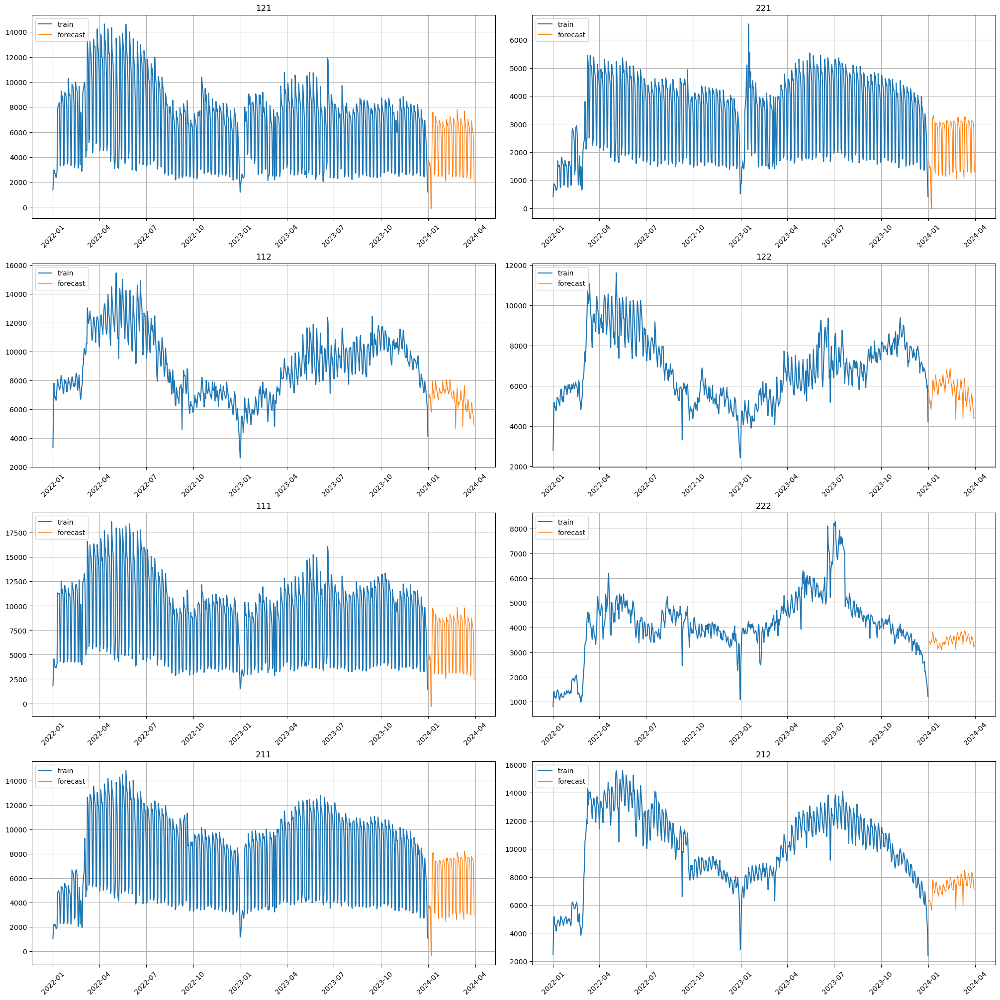

In [1065]:
from etna.analysis import plot_forecast

pipe.fit(ts_2)
forecast_2 = pipe.forecast()

plot_forecast(forecast_ts=forecast_2, train_ts=ts)

Получили прогнозные значения.<br>
Теперь можно сохранить в датафрейм пандас.<br>
Прогнозные значения у нас в строке таргет, так же подтянулись данные по выходным и праздникам.<br>

In [1077]:
df_itog_1 = forecast_1.to_pandas(flatten=True)
df_itog_2 = forecast_2.to_pandas(flatten=True)

In [1086]:
df_itog_1[['timestamp', 'target', 'segment']].round(2).head()

,timestamp,target,segment
0,2024-01-01,6410.12,111
1,2024-01-02,6226.03,111
2,2024-01-03,5687.73,111
3,2024-01-04,6465.97,111
4,2024-01-05,5437.35,111


## ИТОГ

Итоговый анализ предсказания сегментов на 90 дней с использованием модели Prophet показал наилучшие результаты по сравнению с другими моделями, такими как ARIMAX, SARIMA и etna.models.nn.DeepARNativeModel.

Модель Prophet позволила достичь более точных прогнозов благодаря своей способности учитывать сезонность и праздничные эффекты. Однако, существуют возможности для дальнейшего улучшения прогнозов:

Тренд в весенне-летний период: Модель Prophet может быть доработана для более точного учета тренда в весенне-летний период. Это может включать в себя анализ и учет дополнительных сезонных факторов, а также использование более сложных моделей сезонности.

Учет спада к новому году и в новогодние праздники: Для улучшения прогнозов в праздничный период можно добавить специальные параметры, которые будут учитывать спад активности к новому году и во время новогодних праздников. Это позволит модели более точно предсказывать изменения в поведении данных в этот период.

Оптимизация параметров модели: Возможно, стоит провести дополнительный анализ и настройку параметров модели Prophet для достижения оптимальных результатов. Это может включать в себя подбор оптимальных значений параметров, таких как изменение параметров сезонности, коэффициентов роста и т. д.

Использование экзогенных данных: Добавление дополнительных экзогенных данных в модель может улучшить качество прогнозов, особенно если эти данные могут предоставить дополнительную информацию о факторах, влияющих на поведение сегментов.

В целом, модель Prophet продемонстрировала хорошие результаты, но для достижения еще более точных прогнозов можно провести дополнительные исследования и доработки модели.